In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, SymLogNorm, TwoSlopeNorm
import matplotlib.colors as colors
import qcodes as qc
import qcodes.instrument_drivers.nplab_drivers as npd
from scipy.optimize import curve_fit
from scipy.interpolate import interp2d, interp1d
from os import path
import colorcet as cc   # install quickly with "conda install colorcet"
from scipy.interpolate import RectBivariateSpline
from matplotlib import ticker
from scipy.ndimage import gaussian_filter
import matplotlib as mpl
from lmfit import Model

In [2]:
from numpy.linalg import inv

In [3]:
import scipy.io

In [4]:
from matplotlib import cm

In [5]:
from scipy.signal import find_peaks

In [6]:
import glob

In [7]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'svg'

In [8]:
font = {
                'family': 'Arial',
                'size': 12,
                'serif': 'Times',
                'sans-serif': 'Arial'
            }

plt.rc('font', **font)

In [9]:
cd ..

/Users/robertpolski/Documents/NPGroupResearch/Measurements/Triton/qcodes_data


In [10]:
qc.DataSet.default_io.base_location = path.abspath('.')
figfile = path.abspath('.') + '/Figures/TBGWSe2_SecondPaper/'

In [11]:
d_S13_Fan_1 = qc.load_data('data/2020-12-02/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_10-00-27')
d_S13_Fan_2 = qc.load_data('data/2020-12-05/#002_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_21-12-35')
d_S13_Fan_3 = qc.load_data('data/2020-12-07/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_02-19-23')

d_S12_Fan_1 = qc.load_data('data/2020-11-23/#006_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_16-55-29')
d_S12_Fan_2 = qc.load_data('data/2020-11-25/#001_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_00-12-33')

# device S12 fan diagram, T dependence, Rxy symmetry breaking

In [12]:
vg = d_S12_Fan_1.srframe_volt_p1_set[0, :]
B = np.concatenate((data_n_B.triton_field_set_stable_set[:],data_n_B_2.triton_field_set_stable_set[:]))
Rxx1917 = np.vstack((npd.Rxxfromdata(data_n_B, 1e-9, 'lockin865'), npd.Rxxfromdata(data_n_B_2, 1e-9, 'lockin865')))
Rxx1716 = np.vstack((npd.Rxxfromdata(data_n_B, 1e-9, 'lockin830'), npd.Rxxfromdata(data_n_B_2, 1e-9, 'lockin830')))
Rxx1614 = np.vstack((npd.Rxxfromdata(data_n_B, 1e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_B_2, 1e-9, 'lockin830_2')))
Rxx1016 = np.vstack((npd.Rxxfromdata(data_n_B, 1e-9, 'lockin830_3'), npd.Rxxfromdata(data_n_B_2, 1e-9, 'lockin830_3')))

NameError: name 'data_n_B' is not defined

set the full filling and angles of the S12 Rxx 1614:
-S12 Rxx 1614 1.24 degrees: slope (B/V) 10.42, capacitance (4.036e-4 C/V*m^2), full-filling gate range (nu=4 - nu=0) 14.375, V0 somewhere around 0.55, Rxx mainly 16-14, Rxy 16-10

## S12 1.24$^\circ$ fan diagram

In [13]:
d_S12_Fan_1 = qc.load_data('data/2020-11-23/#006_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_16-55-29')
d_S12_Fan_2 = qc.load_data('data/2020-11-25/#001_S12_865_19-17_830_17-16_8302_16-14_8303_10-16_base_1nA_Landaufan_00-12-33')

In [14]:
Bfield = np.concatenate((d_S12_Fan_1.triton_field_set_stable_set[:], d_S12_Fan_2.triton_field_set_stable_set[:]))
gate = d_S12_Fan_1.srframe_volt_p1_set[0, :]
Rxx1614 = abs(np.vstack((d_S12_Fan_1.lockin830_2_X[:,:]/1e-9, d_S12_Fan_2.lockin830_2_X[:,:]/1e-9)))

In [32]:
Vgatefull1614 = 14.375
V01614 = 0.55

In [16]:
nugate1614 = np.interp(gate, [V01614 - Vgatefull1614*5/4, V01614 + Vgatefull1614*5/4], [-5, 5])

In [17]:
Rxx1614Bfunc = RectBivariateSpline(nugate1614, Bfield, Rxx1614.T, kx=1, ky=1)

([<matplotlib.axis.XTick at 0x7fdc305dcdc0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

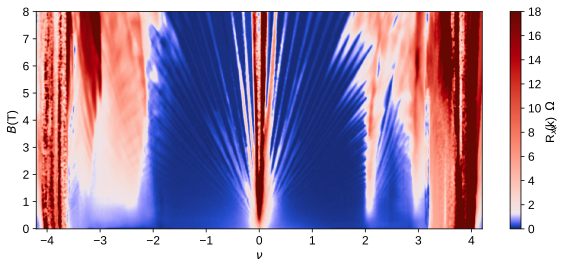

In [18]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxx1614Bint = Rxx1614Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx1614Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(1.3, vmin=0, vmax=18), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

## S12 1.24$^\circ$ T dependence

In [19]:
dtempbase = qc.load_data('data/2020-11-27/#001_S12_865_16-14_830_17-16_8302_19-17_base_1nA_gatesweep_10-58-36')
dtemp_1 = qc.load_data('data/2020-11-27/#002_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweepto1K_11-23-00')
dtemp_2 = qc.load_data('data/2020-11-27/#003_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep1p05to1p4K_17-17-48')
dtemp_3 = qc.load_data('data/2020-11-27/#004_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep1p45to2K_19-38-46')
dtemp_4 = qc.load_data('data/2020-11-27/#005_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep2p1to10K_23-33-38')
dtemp_5 = qc.load_data('data/2020-11-28/#001_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep10p5to30K_22-49-01')
dtemp_6 = qc.load_data('data/2020-11-29/#001_S12_865_16-14_830_17-16_8302_19-17_1nA_sweepgateTsweep30p5to40K_11-05-37')

In [20]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
gate = dtempbase.srframe_volt_p1_set[:]
Rxx1614 = np.vstack((npd.Rxxfromdata(dtempbase, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_1, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_2, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_3, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_4, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_5, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_6, 1e-9, 'lockin865')))

In [21]:
Vgatefull1614 = 14.375
V01614 = 0.55

In [22]:
nugate1614 = np.interp(gate, [V01614 - Vgatefull1614*5/4, V01614 + Vgatefull1614*5/4], [-5, 5])

In [23]:
Rxx1614Tfunc = RectBivariateSpline(nugate1614, temps, Rxx1614.T, kx=1, ky=1)

([<matplotlib.axis.YTick at 0x7fdc138f1ee0>,
 [Text(0, 10, '10'), Text(0, 20, ''), Text(0, 30, ''), Text(0, 40, '40')])

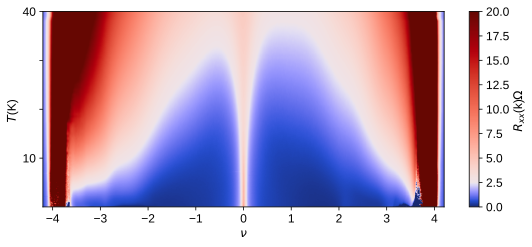

In [24]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0.025, 40, 600)
Rxx1614Tint = Rxx1614Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx1614Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=2.5, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 40))
plt.yticks([10, 20, 30, 40], [10, '', '', 40])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

([<matplotlib.axis.YTick at 0x7fdc30e30040>,
 [Text(0, 0.5, '0.5'), Text(0, 1.0, ''), Text(0, 1.5, ''), Text(0, 2.0, '2')])

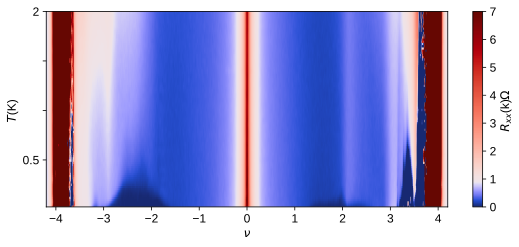

In [25]:
x = np.linspace(-4.2, 4.2, 3000)
y = np.linspace(0.025, 40, 1800)
Rxx1614Tint = Rxx1614Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx1614Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=0.9, vmin=0, vmax=7), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 2))
plt.yticks([0.5, 1,1.5, 2], [0.5, '','', 2])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

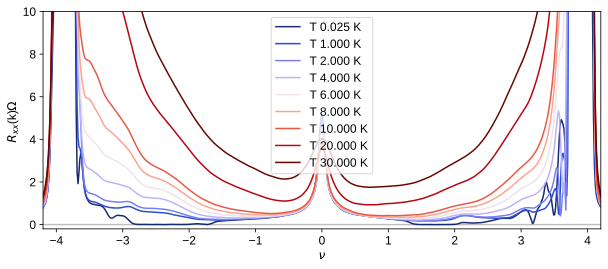

In [26]:
plt.figure(figsize=(10, 4))

N = 9
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(9):
    indx =  i*20
    plt.plot(nugate1614[:], abs(gaussian_filter(Rxx1614[indx,:],2))/1000,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))

plt.hlines(0, -16,16, color='gray', lw=1.5, alpha=0.5)
plt.xlim(-4.2,4.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.ylim(-0.2,10)
plt.legend()

## S12 1.24$^\circ$ Rxy 0.5T symmetry breaking

In [27]:
data_n_T_base = qc.load_data('data/2020-11-30/#004_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_base_5nA_gatesweep_11-41-21')
data_n_T_1 = qc.load_data('data/2020-11-30/#005_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweepto1K_12-02-00')
data_n_T_2 = qc.load_data('data/2020-11-30/#006_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p1to1p4K_15-00-14')
data_n_T_3 = qc.load_data('data/2020-11-30/#007_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p5to2K_16-11-50')
data_n_T_4 = qc.load_data('data/2020-11-30/#008_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep2p2to10K_18-01-35')
data_n_T_5 = qc.load_data('data/2020-12-01/#001_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep10p5to25K_05-52-13')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy1016_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_5, 5e-9, 'lockin865')))

(0.025, 25.0)

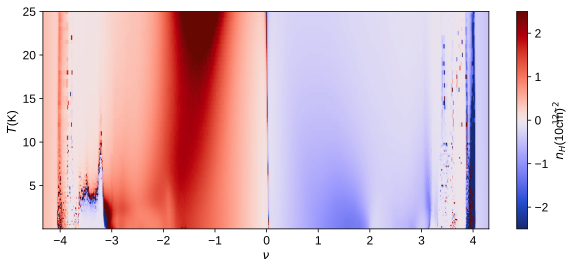

In [28]:
echarge = 1.602e-19
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V01614)/Vgatefull1614*4, temps, 0.5/(Rxy1016_0p5T)/echarge/1e16, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-2.5, vmax=2.5), rasterized=True)


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$n_{H}$ (10$^{12}$cm$^{-2}$)')
plt.axis()
plt.ylim(0.025,25)

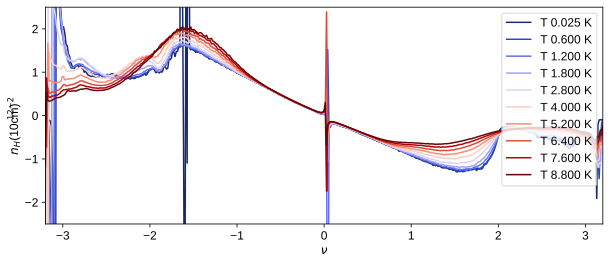

In [29]:
echarge = 1.602e-19

plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*6
    plt.plot((gate[:]-V01614)/Vgatefull1614*4, 0.5/(Rxy1016_0p5T[indx,:])/echarge/1e16,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-3.2,3.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$n_{H}$ (10$^{12}$cm$^{-2}$)')
#plt.yticks([2, 4, 6, 8])
#plt.xticks([0, 1, 2])
plt.ylim(-2.5,2.5)
plt.legend(loc='upper right')

set the full filling and angles of the S12 Rxx 1716:
-S12 Rxx 1716 1.14 degrees: slope (B/V) 10.42, capacitance (4.036e-4 C/V*m^2), full-filling gate range (nu=4 - nu=0) 12.01, V0 somewhere around 0.55, Rxx mainly 17-16

## S12 1.14$^\circ$ fan diagram

In [42]:
Bfield = np.concatenate((d_S12_Fan_1.triton_field_set_stable_set[:], d_S12_Fan_2.triton_field_set_stable_set[:]))
gate = d_S12_Fan_1.srframe_volt_p1_set[0, :]
Rxx1716 = abs(np.vstack((d_S12_Fan_1.lockin830_X[:,:]/1e-9, d_S12_Fan_2.lockin830_X[:,:]/1e-9)))

In [33]:
Vgatefull1716 = 12.01
V01716 = 0.55

In [44]:
nugate1716 = np.interp(gate, [V01716 - Vgatefull1716*6/4, V01716 + Vgatefull1716*6/4], [-6, 6])

In [45]:
Rxx1716Bfunc = RectBivariateSpline(nugate1716, Bfield, Rxx1716.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


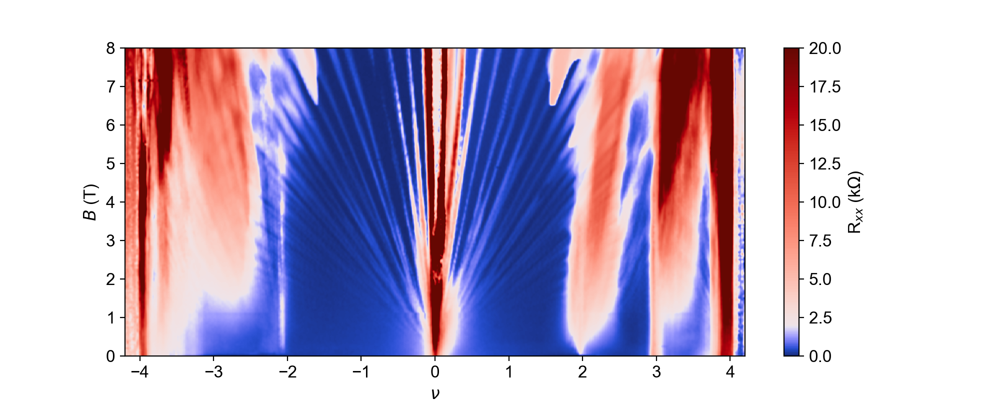

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.XTick at 0x7fc934b311d0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [223]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxx1716Bint = Rxx1716Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx1716Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(2, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

## S12 1.14$^\circ$ T dependence

In [49]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
gate = dtempbase.srframe_volt_p1_set[:]
Rxx1716 = np.vstack((npd.Rxxfromdata(dtempbase, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_1, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_2, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_3, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_4, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_5, 1e-9, 'lockin830'), npd.Rxxfromdata(dtemp_6, 1e-9, 'lockin830')))

NameError: name 'dtemp_1' is not defined

In [50]:
Vgatefull1716 = 12.01
V01716 = 0.55

In [51]:
nugate1716 = np.interp(gate, [V01716 - Vgatefull1716*6/4, V01716 + Vgatefull1716*6/4], [-6, 6])

In [227]:
Rxx1716Tfunc = RectBivariateSpline(nugate1716, temps, Rxx1716.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


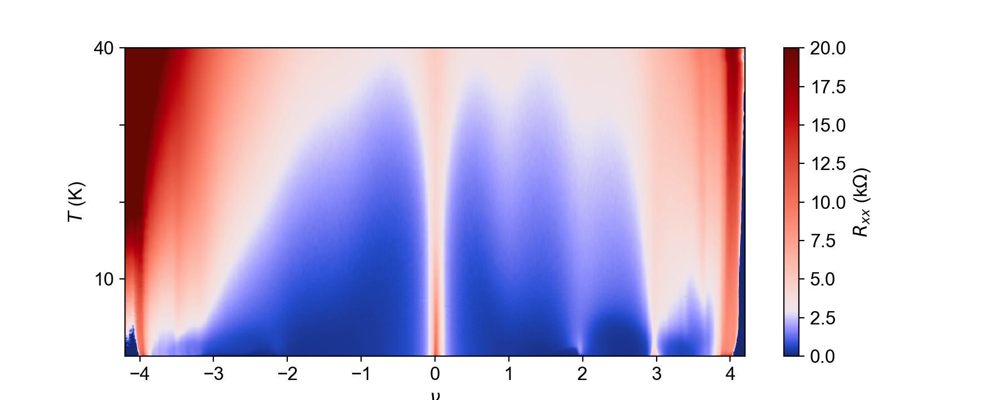

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fc8ed484828>,
 [Text(0, 10, '10'), Text(0, 20, ''), Text(0, 30, ''), Text(0, 40, '40')])

In [254]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0.025, 40, 600)
Rxx1716Tint = Rxx1716Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx1716Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=3, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 40))
plt.yticks([10, 20, 30, 40], [10, '', '', 40])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

<IPython.core.display.Javascript object>


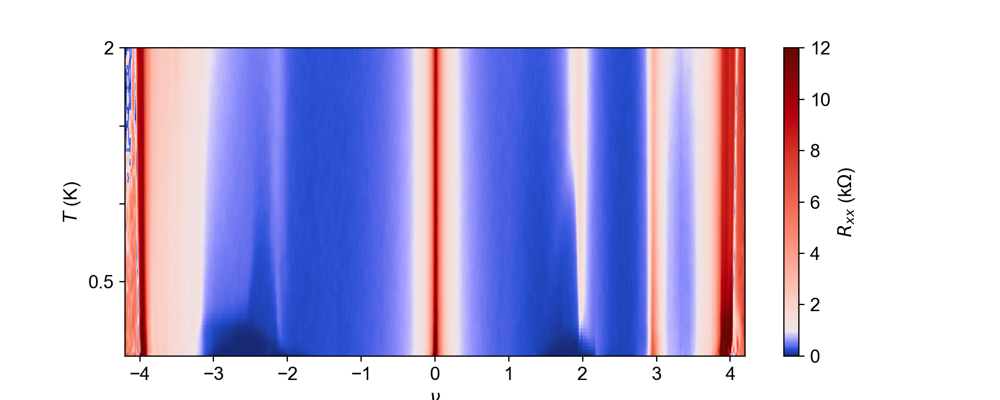

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fc7fc0c19b0>,
 [Text(0, 0.5, '0.5'), Text(0, 1.0, ''), Text(0, 1.5, ''), Text(0, 2.0, '2')])

In [265]:
x = np.linspace(-4.2, 4.2, 3000)
y = np.linspace(0.025, 40, 1800)
Rxx1716Tint = Rxx1716Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(abs(Rxx1716Tint), (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=1, vmin=0, vmax=12), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 2))
plt.yticks([0.5, 1,1.5, 2], [0.5, '','', 2])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

<IPython.core.display.Javascript object>


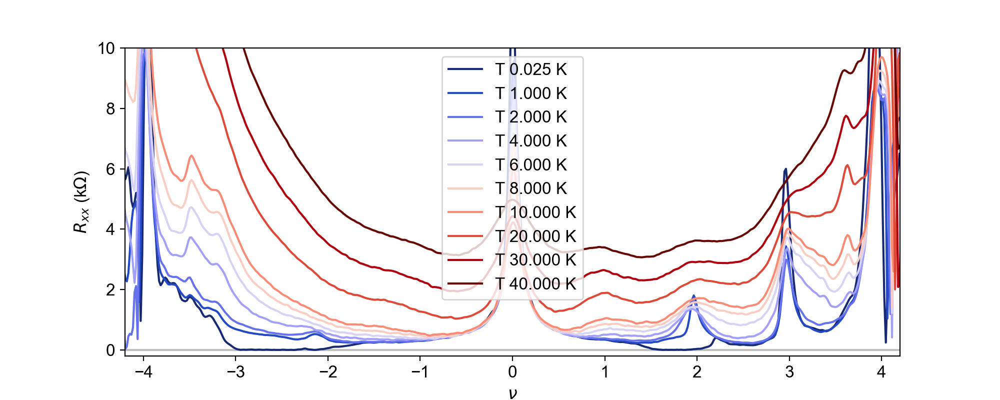

In [269]:
plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*20
    plt.plot(nugate1716[:], abs(gaussian_filter(Rxx1716[indx,:],1))/1000,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))

plt.hlines(0, -16,16, color='gray', lw=1.5, alpha=0.5)
plt.xlim(-4.2,4.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.ylim(-0.2,10)
plt.legend()

## S12 1.14$^\circ$ Rxy 0.5T symmetry breaking

In [34]:
data_n_T_base = qc.load_data('data/2020-11-30/#004_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_base_5nA_gatesweep_11-41-21')
data_n_T_1 = qc.load_data('data/2020-11-30/#005_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweepto1K_12-02-00')
data_n_T_2 = qc.load_data('data/2020-11-30/#006_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p1to1p4K_15-00-14')
data_n_T_3 = qc.load_data('data/2020-11-30/#007_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep1p5to2K_16-11-50')
data_n_T_4 = qc.load_data('data/2020-11-30/#008_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep2p2to10K_18-01-35')
data_n_T_5 = qc.load_data('data/2020-12-01/#001_S12_865_10-16_830_11-14_8302_9-17_8303_8-19_5nA_sweepgateTsweep10p5to25K_05-52-13')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy1114_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_5, 5e-9, 'lockin830')))
Rxy0917_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 5e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_1, 5e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_2, 5e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_3, 5e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_4, 5e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_5, 5e-9, 'lockin830_2')))

/var/folders/l1/53s29dh101l56cxljg7vp9dm0000gn/T/ipykernel_29306/2744147121.py:3: RuntimeWarning: divide by zero encountered in true_divide
  plt.pcolormesh((gate-V01716)/Vgatefull1716*4, temps, 0.5/(Rxy0917_0p5T)/echarge/1e16, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-2.5, vmax=2.5), rasterized=True)


(0.025, 25.0)

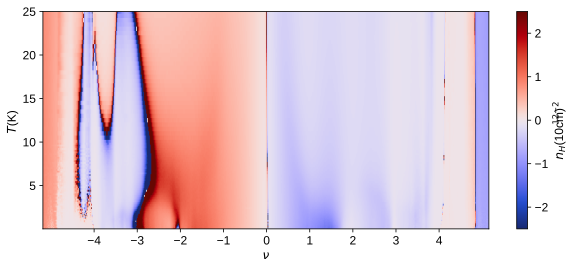

In [35]:
echarge = 1.602e-19
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V01716)/Vgatefull1716*4, temps, 0.5/(Rxy0917_0p5T)/echarge/1e16, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-2.5, vmax=2.5), rasterized=True)


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$n_{H}$ (10$^{12}$cm$^{-2}$)')
plt.axis()
plt.ylim(0.025,25)

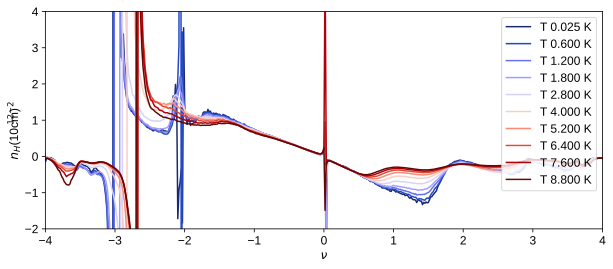

In [38]:
echarge = 1.602e-19

plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*6
    plt.plot((gate[:]-V01716)/Vgatefull1716*4, 0.5/(Rxy0917_0p5T[indx,:])/echarge/1e16,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-4,4)
plt.xlabel(r'$\nu$')
plt.ylabel('$n_{H}$ (10$^{12}$cm$^{-2}$)')
#plt.yticks([2, 4, 6, 8])
#plt.xticks([0, 1, 2])
plt.ylim(-2,4)
plt.legend(loc='upper right')

# device S13 fan diagram, T dependence, Rxy symmetry breaking

1.08$^\circ$ pair see the other notebook

## S13 1.03$^\circ$ fan diagram

set the full filling and angles of the S13:
-S13 1.03 degrees: slope (B/V) 11.55, capacitance (4.477e-4 C/V*m^2), full-filling gate range (nu=4 - nu=0) 8.96, V0 somewhere around 0.5, Rxx mainly 03-02, Rxy mainly 02-29

In [24]:
d_S13_Fan_1 = qc.load_data('data/2020-12-02/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_10-00-27')
d_S13_Fan_2 = qc.load_data('data/2020-12-05/#002_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_21-12-35')
d_S13_Fan_3 = qc.load_data('data/2020-12-07/#001_S13_865_3-2_830_2-25_8302_4-3_8303_29-2_base_1nA_Landaufan_02-19-23')

In [299]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set[:45], d_S13_Fan_2.triton_field_set_stable_set[1:59], d_S13_Fan_3.triton_field_set_stable_set[1:]))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxx0302 = abs(np.vstack((d_S13_Fan_1.lockin865_X[:45,:]/1e-9, d_S13_Fan_2.lockin865_X[1:59,:]/1e-9, d_S13_Fan_3.lockin865_X[1:,:]/1e-9)))

In [300]:
Vgatefull0302 = 8.96
V00302 = 0.5

In [301]:
nugate0302 = np.interp(gate, [V00302 - Vgatefull0302*6/4, V00302 + Vgatefull0302*6/4], [-6, 6])

In [302]:
Rxx0302Bfunc = RectBivariateSpline(nugate0302, Bfield, Rxx0302.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


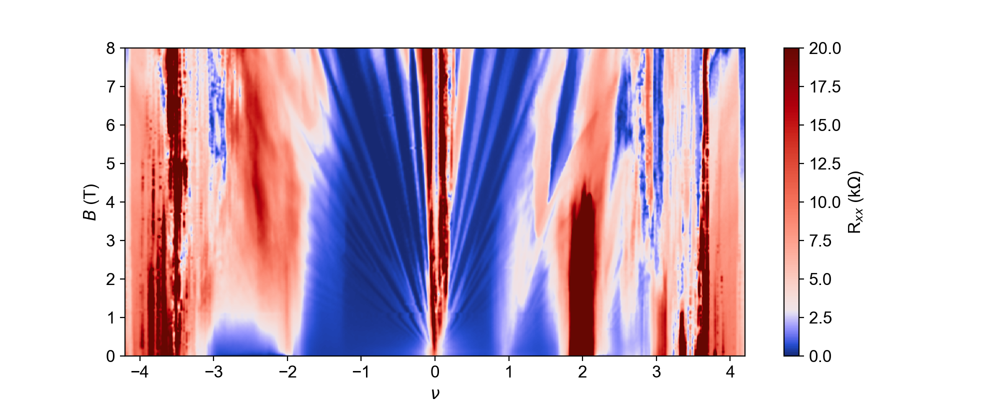

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.XTick at 0x7fc7f05a30b8>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [307]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxx0302Bint = Rxx0302Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0302Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(3, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

## S13 1.03$^\circ$ T dependence

In [308]:
dtempbase = qc.load_data('data/2020-12-03/#004_S13_865_3-2_830_2-25_8302_4-3_base_1nA_gatesweep_11-31-59')
dtemp_1 = qc.load_data('data/2020-12-03/#005_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweepto1K_11-50-09')
dtemp_2 = qc.load_data('data/2020-12-03/#006_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p05to1p4K_17-12-31')
dtemp_3 = qc.load_data('data/2020-12-03/#007_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep1p45to2K_19-21-48')
dtemp_4 = qc.load_data('data/2020-12-03/#008_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep2p1to10K_22-51-46')
dtemp_5 = qc.load_data('data/2020-12-04/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep10p5to30K_20-18-38')
dtemp_6 = qc.load_data('data/2020-12-05/#001_S13_865_3-2_830_2-25_8302_4-3_1nA_sweepgateTsweep30p5to40K_07-42-45')

In [309]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
gate = dtempbase.srframe_volt_p1_set[:]
Rxx0302 = np.vstack((npd.Rxxfromdata(dtempbase, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_1, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_2, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_3, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_4, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_5, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_6, 1e-9, 'lockin865')))

In [311]:
Vgatefull0302 = 8.96
V00302 = 0.5

In [312]:
nugate0302 = np.interp(gate, [V00302 - Vgatefull0302*6/4, V00302 + Vgatefull0302*6/4], [-6, 6])

In [313]:
Rxx0302Tfunc = RectBivariateSpline(nugate0302, temps, Rxx0302.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


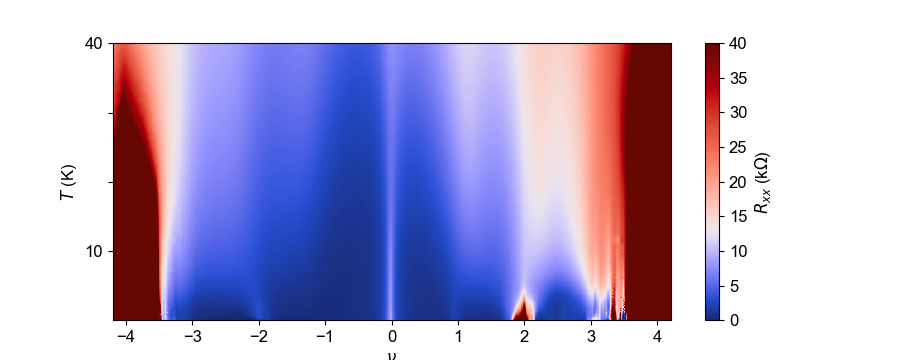

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fc7fd6b0dd8>,
 [Text(0, 10, '10'), Text(0, 20, ''), Text(0, 30, ''), Text(0, 40, '40')])

In [328]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0.025, 40, 600)
Rxx0302Tint = Rxx0302Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx0302Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=13, vmin=0, vmax=40), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 40))
plt.yticks([10, 20, 30, 40], [10, '', '', 40])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

<IPython.core.display.Javascript object>


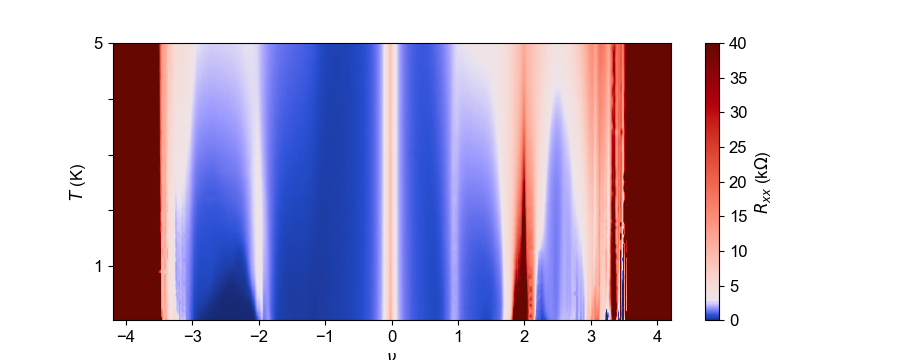

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fc69c0ca588>,
 [Text(0, 1, '1'),
  Text(0, 2, ''),
  Text(0, 3, ''),
  Text(0, 4, ''),
  Text(0, 5, '5')])

In [340]:
x = np.linspace(-4.2, 4.2, 3000)
y = np.linspace(0.025, 40, 1800)
Rxx0302Tint = Rxx0302Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx0302Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=3, vmin=0, vmax=40), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 5))
plt.yticks([1, 2 , 3, 4, 5], [1, '' , '', '', 5])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

<IPython.core.display.Javascript object>


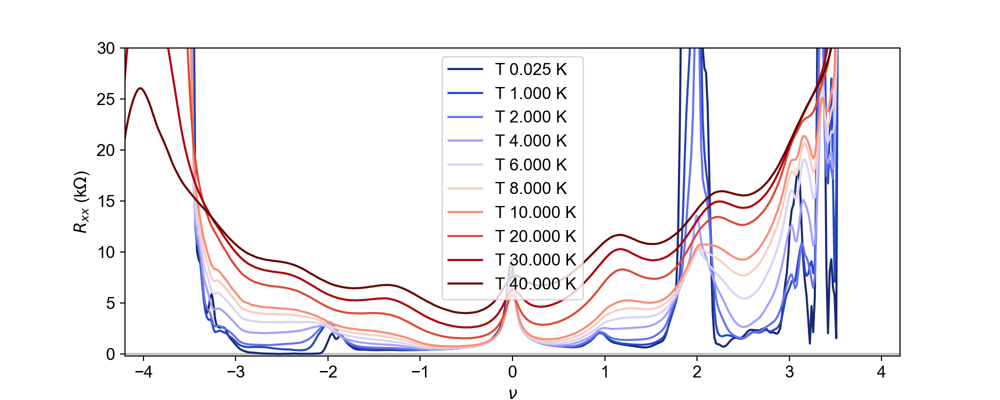

In [344]:
plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*20
    plt.plot(nugate0302[:], abs(gaussian_filter(Rxx0302[indx,:],1))/1000,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))

plt.hlines(0, -16,16, color='gray', lw=1.5, alpha=0.5)
plt.xlim(-4.2,4.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.ylim(-0.2,30)
plt.legend()

## S13 1.03$^\circ$ Rxy 0.5T symmetry breaking

In [75]:
data_n_T_base = qc.load_data('data/2020-12-29/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_21-58-23')
data_n_T_1 = qc.load_data('data/2020-12-29/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy0p5T_22-17-21')
data_n_T_2 = qc.load_data('data/2020-12-30/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_03-45-27')
data_n_T_3 = qc.load_data('data/2020-12-30/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_04-51-41')
data_n_T_4 = qc.load_data('data/2020-12-30/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_09-50-17')
data_n_T_5 = qc.load_data('data/2020-12-30/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy0p5T_20-46-45')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy0229_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin830')))

In [76]:
data_n_T_base = qc.load_data('data/2020-12-31/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_-0p5T_15-14-12')
data_n_T_1 = qc.load_data('data/2020-12-31/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy-0p5T_15-31-16')
data_n_T_2 = qc.load_data('data/2020-12-31/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_20-59-14')
data_n_T_3 = qc.load_data('data/2020-12-31/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_22-05-25')
data_n_T_4 = qc.load_data('data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35')
data_n_T_5 = qc.load_data('data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy0229_m0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin830')))

<IPython.core.display.Javascript object>


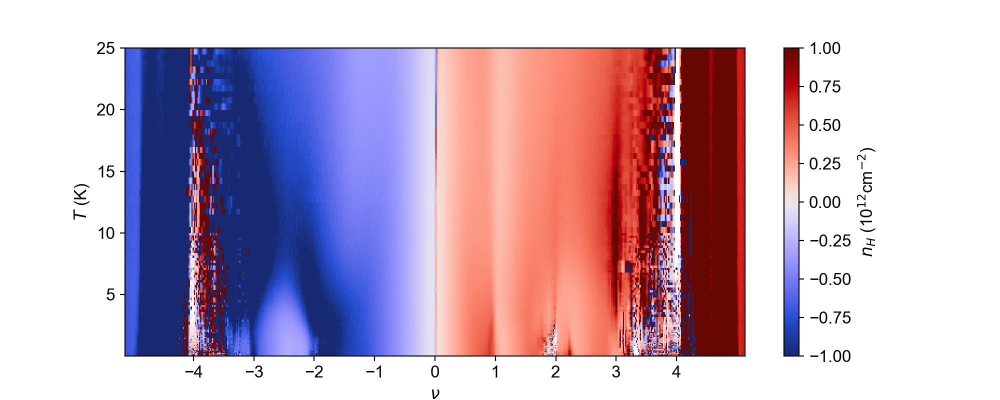

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  This is separate from th

(0.025, 25.0)

In [347]:
echarge = 1.602e-19
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V00302)/Vgatefull0302*4, temps, 0.5/((Rxy0229_0p5T-Rxy0229_m0p5T)/2)/echarge/1e16, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-1, vmax=1))


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')

plt.colorbar(label='$n_{H}$ (10$^{12}$cm$^{-2}$)')
plt.axis()
plt.ylim(0.025,25)

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


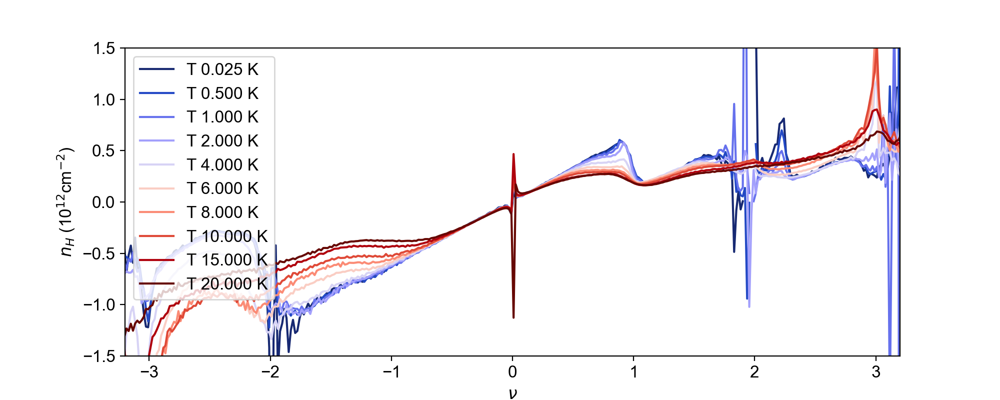

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from 

In [348]:
echarge = 1.602e-19

plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*10
    plt.plot((gate-V00302)/Vgatefull0302*4, 0.5/((Rxy0229_0p5T[indx,:]-Rxy0229_m0p5T[indx,:])/2)/echarge/1e16,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-3.2,3.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$n_{H}$ (10$^{12}$cm$^{-2}$)')
#plt.yticks([2, 4, 6, 8])
#plt.xticks([0, 1, 2])
plt.ylim(-1.5,1.5)
plt.legend()

## S13 0.92$^\circ$ fan diagram

set the full filling and angles of the S13:
-S13 0.92 degrees: slope (B/V) 11.55, capacitance (4.477e-4 C/V*m^2), full-filling gate range (nu=4 - nu=0) 7.76, V0 somewhere around 0.5, Rxx mainly 04-03, Rxy mainly 02-29

In [61]:
Bfield = np.concatenate((d_S13_Fan_1.triton_field_set_stable_set[:45], d_S13_Fan_2.triton_field_set_stable_set[1:59], d_S13_Fan_3.triton_field_set_stable_set[1:]))
gate = d_S13_Fan_1.srframe_volt_p1_set[0, :]
Rxx0403 = abs(np.vstack((d_S13_Fan_1.lockin830_2_X[:45,:]/1e-9, d_S13_Fan_2.lockin830_2_X[1:59,:]/1e-9, d_S13_Fan_3.lockin830_2_X[1:,:]/1e-9)))

In [62]:
Vgatefull0403 = 7.76
V00403 = 0.5

In [63]:
nugate0403 = np.interp(gate, [V00403 - Vgatefull0403*6/4, V00403 + Vgatefull0403*6/4], [-6, 6])

In [64]:
Rxx0403Bfunc = RectBivariateSpline(nugate0403, Bfield, Rxx0403.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


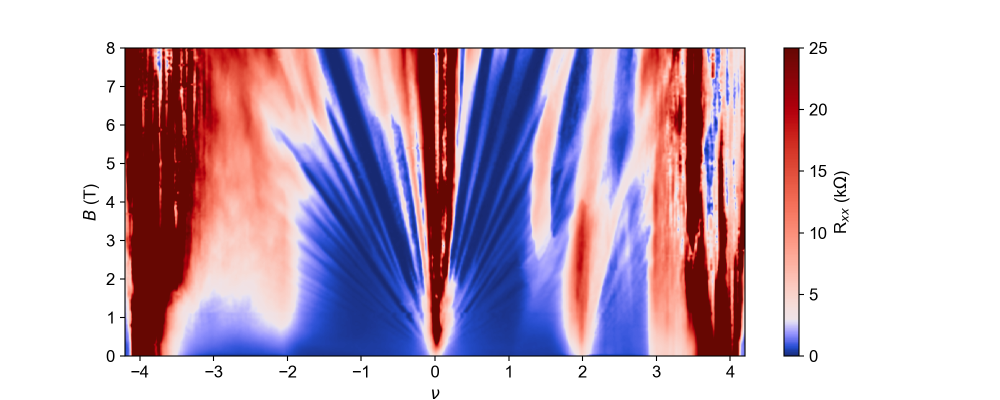

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.XTick at 0x7fc6a1528940>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [356]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0, 8, 600)
Rxx0403Bint = Rxx0403Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx0403Bint, (1.2, 1.2))/1000, norm=TwoSlopeNorm(3, vmin=0, vmax=25), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

## S13 0.92$^\circ$ T dependence

In [65]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
gate = dtempbase.srframe_volt_p1_set[:]
Rxx0403 = np.vstack((npd.Rxxfromdata(dtempbase, 1e-9, 'lockin830_2'), npd.Rxxfromdata(dtemp_1, 1e-9, 'lockin830_2'), npd.Rxxfromdata(dtemp_2, 1e-9, 'lockin830_2'), npd.Rxxfromdata(dtemp_3, 1e-9, 'lockin830_2'), npd.Rxxfromdata(dtemp_4, 1e-9, 'lockin830_2'), npd.Rxxfromdata(dtemp_5, 1e-9, 'lockin830_2'), npd.Rxxfromdata(dtemp_6, 1e-9, 'lockin830_2')))

NameError: name 'dtemp_1' is not defined

In [66]:
nugate0403 = np.interp(gate, [V00403 - Vgatefull0403*6/4, V00403 + Vgatefull0403*6/4], [-6, 6])

In [67]:
Rxx0403Tfunc = RectBivariateSpline(nugate0403, temps, Rxx0403.T, kx=1, ky=1)

ValueError: y dimension of z must have same number of elements as y

In [68]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0.025, 40, 600)
Rxx0403Tint = Rxx0403Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx0403Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=4.5, vmin=0, vmax=15), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 40))
plt.yticks([10, 20, 30, 40], [10, '', '', 40])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

NameError: name 'Rxx0403Tfunc' is not defined

<IPython.core.display.Javascript object>


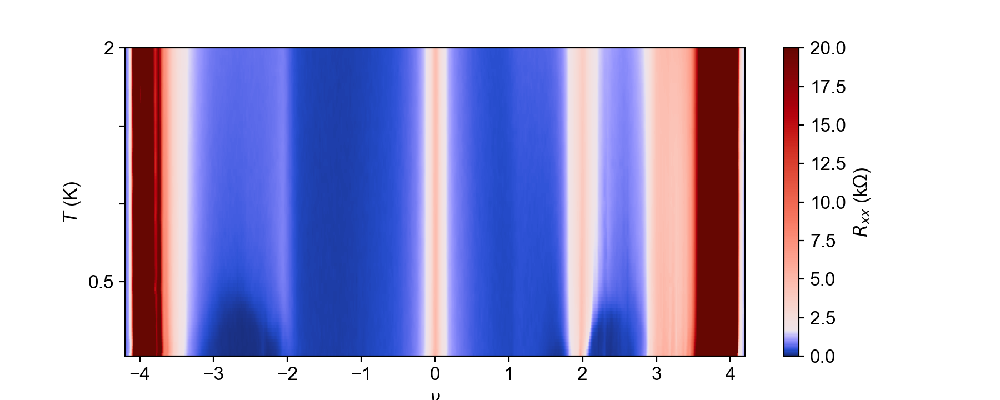

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fc5ac0e5ef0>,
 [Text(0, 0.5, '0.5'), Text(0, 1.0, ''), Text(0, 1.5, ''), Text(0, 2.0, '2')])

In [379]:
x = np.linspace(-4.2, 4.2, 3000)
y = np.linspace(0.025, 40, 1800)
Rxx0403Tint = Rxx0403Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx0403Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=1.7, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 2))
plt.yticks([0.5, 1,1.5, 2], [0.5, '','', 2])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

<IPython.core.display.Javascript object>


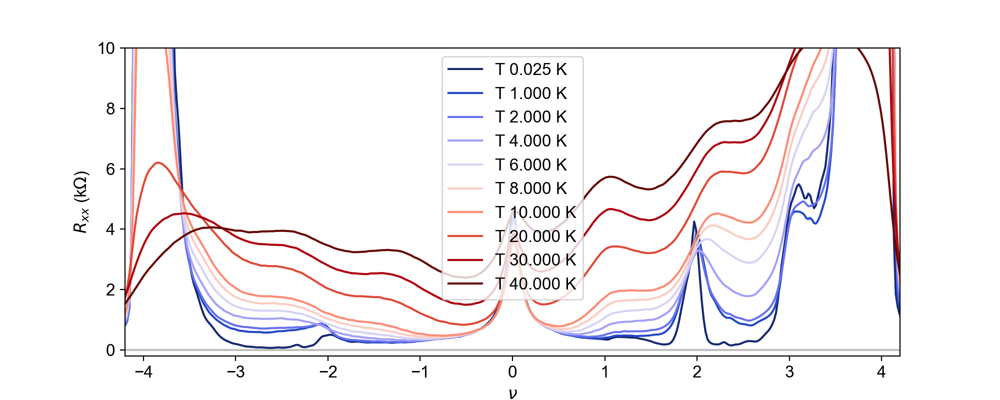

In [382]:
plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*20
    plt.plot(nugate0403[:], abs(gaussian_filter(Rxx0403[indx,:],1))/1000,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))

plt.hlines(0, -16,16, color='gray', lw=1.5, alpha=0.5)
plt.xlim(-4.2,4.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.ylim(-0.2,10)
plt.legend()

## S13 0.92$^\circ$ Rxy 0.5T symmetry breaking

In [383]:
data_n_T_base = qc.load_data('data/2020-12-29/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_21-58-23')
data_n_T_1 = qc.load_data('data/2020-12-29/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy0p5T_22-17-21')
data_n_T_2 = qc.load_data('data/2020-12-30/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy0p5T_03-45-27')
data_n_T_3 = qc.load_data('data/2020-12-30/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy0p5T_04-51-41')
data_n_T_4 = qc.load_data('data/2020-12-30/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy0p5T_09-50-17')
data_n_T_5 = qc.load_data('data/2020-12-30/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy0p5T_20-46-45')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy0330_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin830_2')))

In [384]:
data_n_T_base = qc.load_data('data/2020-12-31/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_base_3nA_gatesweep_-0p5T_15-14-12')
data_n_T_1 = qc.load_data('data/2020-12-31/#002_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweepto1K_Rxy-0p5T_15-31-16')
data_n_T_2 = qc.load_data('data/2020-12-31/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p1to1p4K_Rxy-0p5T_20-59-14')
data_n_T_3 = qc.load_data('data/2020-12-31/#004_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep1p5to2K_Rxy-0p5T_22-05-25')
data_n_T_4 = qc.load_data('data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35')
data_n_T_5 = qc.load_data('data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16')
gate = data_n_T_base.srframe_volt_p1_set [:]
temps = np.concatenate(([0.025], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:],data_n_T_5.triton_pid_setpoint_set[:]))
Rxy0330_m0p5T = np.vstack((npd.Rxxfromdata(data_n_T_base, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_1, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_2, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_3, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_4, 3e-9, 'lockin830_2'), npd.Rxxfromdata(data_n_T_5, 3e-9, 'lockin830_2')))

error reading file /Users/yiranzhang/Desktop/Triton data/data/2021-01-01/#001_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep2p2to10K_Rxy-0p5T_00-23-35/triton_pid_setpoint_set_srframe_volt_p1_set 2.dat
Traceback (most recent call last):
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/format.py", line 112, in read
    self.read_one_file(data_set, f, ids_read)
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/gnuplot_format.py", line 167, in read_one_file
    raise ValueError('duplicate data id found: ' + array_id)
ValueError: duplicate data id found: lockin830_2_X

error reading file /Users/yiranzhang/Desktop/Triton data/data/2021-01-01/#003_S13_865_25-28_830_2-29_8302_3-30_8303_4-31_3nA_sweepgateTsweep10p5to25K_Rxy-0p5T_11-32-16/triton_pid_setpoint_set_srframe_volt_p1_set 2.dat
Traceback (most recent call last):
  File "/Users/yiranzhang/Documents/GitHub/Qcodes/qcodes/data/format.py", line 112, in read
    self.read_one_file(data_set, f, ids_rea

<IPython.core.display.Javascript object>


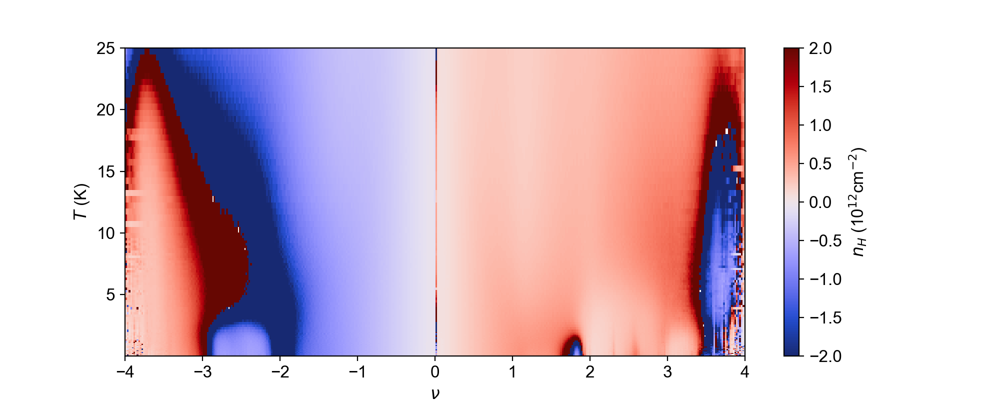

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  This is separate from th

(0.025, 25.0)

In [388]:
echarge = 1.602e-19
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V00403)/Vgatefull0403*4, temps, 0.5/((Rxy0330_0p5T-Rxy0330_m0p5T)/2)/echarge/1e16, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-2, vmax=2))


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')
plt.xlim(-4,4)
plt.colorbar(label='$n_{H}$ (10$^{12}$cm$^{-2}$)')
plt.axis()
plt.ylim(0.025,25)

<IPython.core.display.Javascript object>


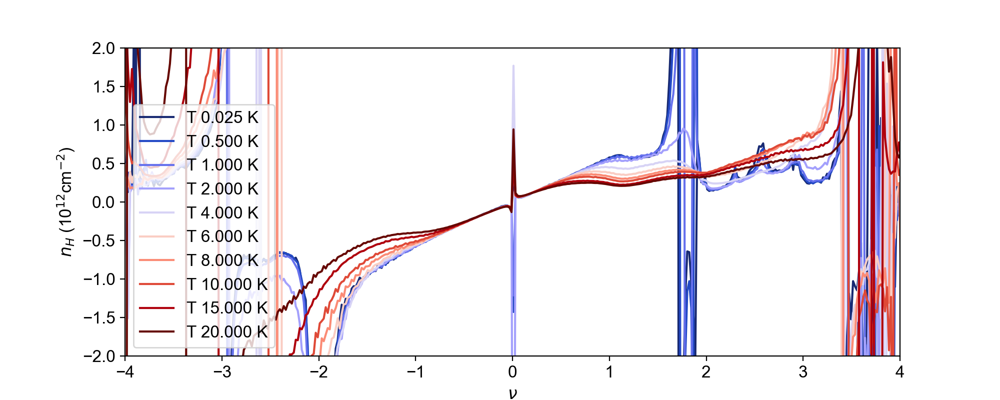

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from 

In [391]:
echarge = 1.602e-19

plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*10
    plt.plot((gate-V00403)/Vgatefull0403*4, 0.5/((Rxy0330_0p5T[indx,:]-Rxy0330_m0p5T[indx,:])/2)/echarge/1e16,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-4,4)
plt.xlabel(r'$\nu$')
plt.ylabel('$n_{H}$ (10$^{12}$cm$^{-2}$)')
#plt.yticks([2, 4, 6, 8])
#plt.xticks([0, 1, 2])
plt.ylim(-2,2)
plt.legend()

# device S3 0.88$^\circ$ fan diagram, T dependence, Rxy symmetry breaking

## S3 0.88$^\circ$ fan diagram

set the full filling and angles of the S13:
-S3 0.88 degrees: slope (B/V) 32.42 (dual gate), capacitance (12.55e-4 C/V*m^2), full-filling gate range (nu=4 - nu=0) 2.315, V0 somewhere around -0.805, Rxx mainly 35-34, Rxy mainly 35-38

In [392]:
d_S3_Fan_1 = qc.load_data('data/2020-10-21/#017_S3_865_35-34_830_34-33_8302_40-41_2nA_0D_0to6T_fieldgate_13-46-23')
d_S3_Fan_2 = qc.load_data('data/2020-10-22/#001_S3_865_35-34_830_34-33_8302_40-41_2nA_0D_6p05to8T_fieldgate_20-13-47')

In [393]:
Bfield = np.concatenate((d_S3_Fan_1.triton_field_set_stable_set[:], d_S3_Fan_2.triton_field_set_stable_set[:]))
gate = d_S3_Fan_1.zeroDparam_set[0, :]
Rxx3534 = abs(np.vstack((d_S3_Fan_1.lockin865_X[:,:]/2e-9, d_S3_Fan_2.lockin865_X[:,:]/2e-9)))

In [395]:
Vgatefull3534 = 2.315
V03534 = -0.805

In [396]:
nugate3534 = np.interp(gate, [V03534 - Vgatefull3534*6/4, V03534 + Vgatefull3534*6/4], [-6, 6])
Rxx3534Bfunc = RectBivariateSpline(nugate3534, Bfield, Rxx3534.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


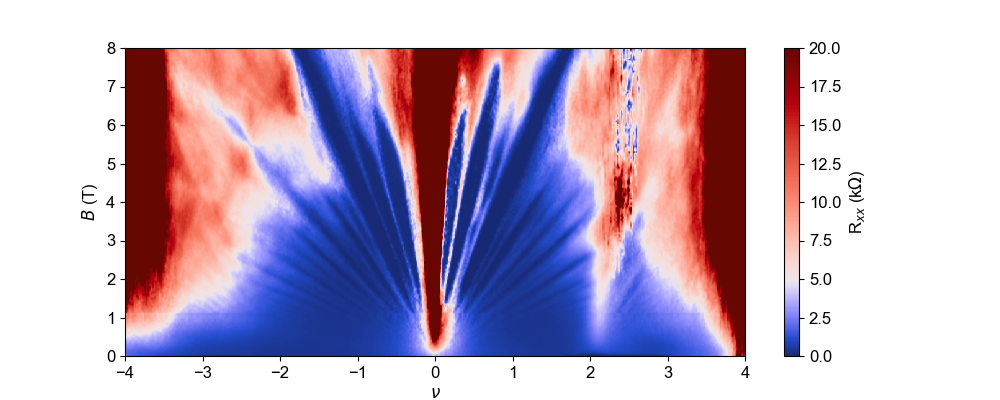

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.XTick at 0x7fc5f1b4eac8>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

In [434]:
x = np.linspace(-4, 4, 1000)
y = np.linspace(0, 8, 600)
Rxx3534Bint = Rxx3534Bfunc(x, y).T

plt.figure(figsize=(10, 4))
plt.pcolormesh(x, y, gaussian_filter(Rxx3534Bint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(5, vmin=0, vmax=20), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='R$_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel(r'$B$ (T)')
plt.xticks([-4, -3, -2, -1, 0, 1, 2, 3, 4])     
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)
#plt.savefig(figfile + 'S13_1p09_Rxx0225_Fan.svg', dpi=300, bbox_inches='tight')

## S3 0.88$^\circ$ T dependence

In [404]:
dtempbase = qc.load_data('data/2020-09-05/#002_S3_865_35-34_830_34-33_8302_40-41_1nA_0T_0Dsweep_baseT_21-39-49')
dtemp_1 = qc.load_data('data/2020-09-05/#003_S3_865_35-34_830_34-33_8302_40-41_1nA_D0_gateTsweepto1K_21-59-28')
dtemp_2 = qc.load_data('data/2020-09-06/#002_S3_865_35-34_830_34-33_8302_40-41_1nA_D0_gateTsweep_1p05to1p4K_08-51-18')
dtemp_3 = qc.load_data('data/2020-09-06/#003_S3_865_35-34_830_34-33_8302_40-41_1nA_D0_gateTsweep_1p45to2K_10-53-21')
dtemp_4 = qc.load_data('data/2020-09-06/#004_S3_865_35-34_830_34-33_8302_40-41_1nA_D0_gateTsweep_2p1to10K_14-00-29')
dtemp_5 = qc.load_data('data/2020-09-07/#001_S3_865_35-34_830_34-33_8302_40-41_1nA_D0_gateTsweep_10p5to30K_10-15-14')
dtemp_6 = qc.load_data('data/2020-09-07/#002_S3_865_35-34_830_34-33_8302_40-41_1nA_D0_gateTsweep_30p5to40K_21-03-39')

In [406]:
temps = np.concatenate(([0.025], dtemp_1.triton_pid_setpoint_set, dtemp_2.triton_pid_setpoint_set[:], dtemp_3.triton_pid_setpoint_set, dtemp_4.triton_pid_setpoint_set[:], dtemp_5.triton_pid_setpoint_set, dtemp_6.triton_pid_setpoint_set[:]))
gate = dtempbase.zeroDparam_set[:]
Rxx3534 = np.vstack((npd.Rxxfromdata(dtempbase, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_1, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_2, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_3, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_4, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_5, 1e-9, 'lockin865'), npd.Rxxfromdata(dtemp_6, 1e-9, 'lockin865')))

In [419]:
Vgatefull3534 = 2.35
V03534 = -0.805

In [420]:
nugate3534 = np.interp(gate, [V03534 - Vgatefull3534*6/4, V03534 + Vgatefull3534*6/4], [-6, 6])

In [421]:
Rxx3534Tfunc = RectBivariateSpline(nugate3534, temps, Rxx3534.T, kx=1, ky=1)

<IPython.core.display.Javascript object>


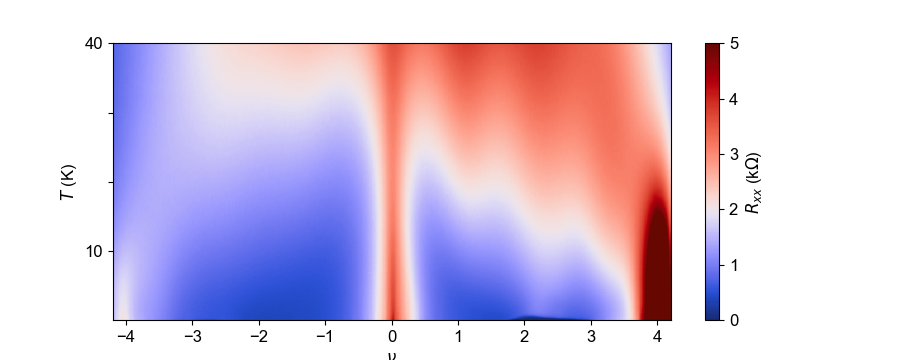

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fc59eb4ce80>,
 [Text(0, 10, '10'), Text(0, 20, ''), Text(0, 30, ''), Text(0, 40, '40')])

In [422]:
x = np.linspace(-4.2, 4.2, 1000)
y = np.linspace(0.025, 40, 600)
Rxx3534Tint = Rxx3534Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx3534Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=2, vmin=0, vmax=5), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')


plt.ylim((0.025, 40))
plt.yticks([10, 20, 30, 40], [10, '', '', 40])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

<IPython.core.display.Javascript object>


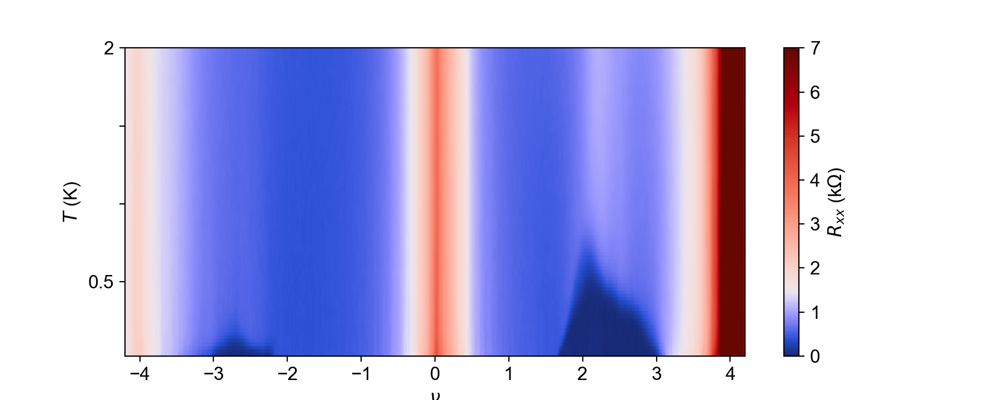

/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/Users/yiranzhang/anaconda3/envs/qcodes/lib/python3.6/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  


([<matplotlib.axis.YTick at 0x7fc6a0829e80>,
 [Text(0, 0.5, '0.5'), Text(0, 1.0, ''), Text(0, 1.5, ''), Text(0, 2.0, '2')])

In [445]:
x = np.linspace(-4.2, 4.2, 3000)
y = np.linspace(0.025, 40, 1800)
Rxx3534Tint = Rxx3534Tfunc(x, y).T

plt.figure(figsize=(9, 3.6))
plt.pcolormesh(x, y, gaussian_filter(Rxx3534Tint, (0.5, 0.5))/1000, norm=TwoSlopeNorm(vcenter=1.5, vmin=0, vmax=7), cmap=cc.cm.diverging_bwr_20_95_c54, rasterized=True)
plt.colorbar(label='$R_{xx}$ (k$\Omega$)')
plt.xlabel(r'$\nu$')
plt.ylabel('$T$ (K)')



plt.ylim((0.025, 2))
plt.yticks([0.5, 1,1.5, 2], [0.5, '','', 2])
# plt.minorticks_on()
# plt.tick_params(axis='x', which='minor', bottom=False)

<IPython.core.display.Javascript object>


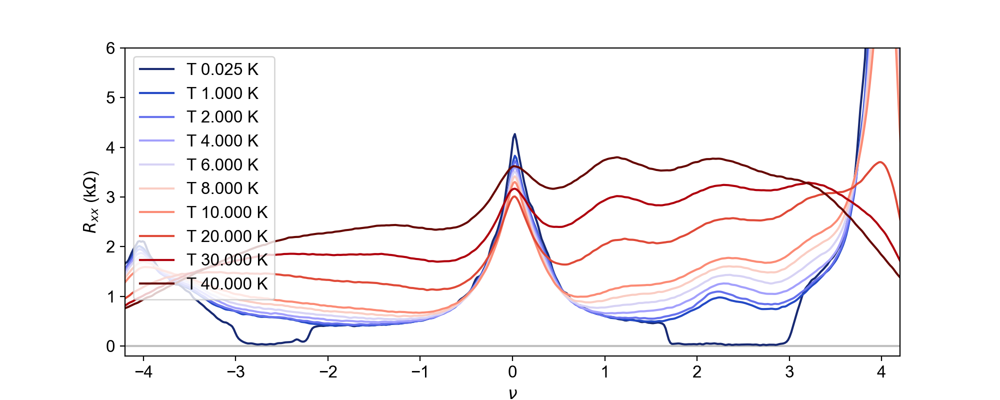

In [448]:
plt.figure(figsize=(10, 4))

N = 10
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(10):
    indx =  i*20
    plt.plot(nugate3534[:], abs(gaussian_filter(Rxx3534[indx,:],1))/1000,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))

plt.hlines(0, -16,16, color='gray', lw=1.5, alpha=0.5)
plt.xlim(-4.2,4.2)
plt.xlabel(r'$\nu$')
plt.ylabel('$R_{xx}$ (k$\Omega$)')
plt.ylim(-0.2,6)
plt.legend()

## S3 0.88$^\circ$ Rxy 0.5T symmetry breaking

In [77]:
data_n_T_0 = qc.load_data('data/2020-10-28/#003_S3_865_35-38_830_34-39_8302_33-40_5nA_0p5T_0DsweepgateTsweepto1K_Rxy_18-48-03')
data_n_T_1 = qc.load_data('data/2020-10-29/#001_S3_865_35-38_830_34-39_8302_33-40_5nA_0p5T_0DsweepgateTsweep1p05to1p4K_Rxy_00-28-00')
data_n_T_2 = qc.load_data('data/2020-10-29/#002_S3_865_35-38_830_34-39_8302_33-40_5nA_0p5T_0DsweepgateTsweep1p45to2K_Rxy_02-38-44')
data_n_T_3 = qc.load_data('data/2020-10-29/#003_S3_865_35-38_830_34-39_8302_33-40_5nA_0p5T_0DsweepgateTsweep2p1to10K_Rxy_10-27-08')
data_n_T_4 = qc.load_data('data/2020-10-30/#001_S3_865_35-38_830_34-39_8302_33-40_5nA_0p5T_0DsweepgateTsweep10p25to30K_Rxy_08-08-56')
gate = data_n_T_0.zeroDparam_set [0,:]
temps = np.concatenate((data_n_T_0.triton_pid_setpoint_set[:], data_n_T_1.triton_pid_setpoint_set[:],data_n_T_2.triton_pid_setpoint_set[:] ,data_n_T_3.triton_pid_setpoint_set[:] ,data_n_T_4.triton_pid_setpoint_set[:]))
Rxy3538_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_0, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_1, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_2, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_3, 5e-9, 'lockin865'), npd.Rxxfromdata(data_n_T_4, 5e-9, 'lockin865')))
Rxy3439_0p5T = np.vstack((npd.Rxxfromdata(data_n_T_0, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_1, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_2, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_3, 5e-9, 'lockin830'), npd.Rxxfromdata(data_n_T_4, 5e-9, 'lockin830')))

In [78]:
Vgatefull3534 = 2.315
V03534 = -0.805

(0.025, 25)

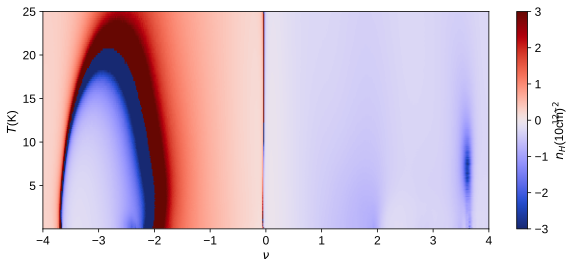

In [79]:
echarge = 1.602e-19
plt.figure(figsize=(10, 4))
plt.pcolormesh((gate-V03534)/Vgatefull3534*4, temps, 0.5/Rxy3538_0p5T/echarge/1e16, cmap=cc.cm.diverging_bwr_20_95_c54, norm=TwoSlopeNorm(vcenter=0, vmin=-3, vmax=3), rasterized=True)


plt.xlabel(r'$\nu$')
plt.xticks([-4 ,-3, -2, -1, 0, 1, 2, 3, 4])
plt.ylabel('$T$ (K)')
plt.xlim(-4,4)
plt.colorbar(label='$n_{H}$ (10$^{12}$cm$^{-2}$)')
plt.axis()
plt.ylim(0.025,25)

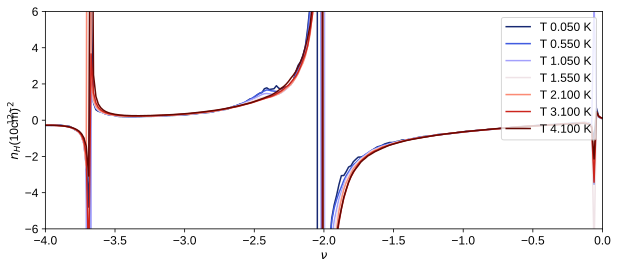

In [74]:
echarge = 1.602e-19

plt.figure(figsize=(10, 4))

N = 7
cs = plt.get_cmap(cc.cm.diverging_bwr_20_95_c54)(np.linspace(0,1,N))

for i in range(N):
    indx =  i*10
    plt.plot((gate-V03534)/Vgatefull3534*4, -0.5/(gaussian_filter(Rxy3538_0p5T[indx,:], 0.7))/echarge/1e16,  color = cs[i], label='T {:.3f} K'.format(temps[indx]))


plt.xlim(-4,0)
plt.xlabel(r'$\nu$')
plt.ylabel('$n_{H}$ (10$^{12}$cm$^{-2}$)')
#plt.yticks([2, 4, 6, 8])
#plt.xticks([0, 1, 2])
plt.ylim(-6,6)
plt.legend(loc='upper right')

# M30